<a href="https://colab.research.google.com/github/ibonetc/IA_2026/blob/main/ML_FeatureSelection_comparacion_metodos_SHAP.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Selección de rasgos



## Métodos basados en filtros

### Eliminar rasgos con baja varianza (Rasgos quasi-constantes)

In [4]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [5]:
import pandas as pd
import numpy as np
import sklearn.feature_selection as fs
import matplotlib.pyplot as plt
import seaborn as sns

In [6]:
data = pd.read_csv('/content/drive/MyDrive/Datasets/customer_satisfaction.csv')
data.head()

,ID,var3,var15,imp_ent_var16_ult1,imp_op_var39_comer_ult1,imp_op_var39_comer_ult3,imp_op_var40_comer_ult1,imp_op_var40_comer_ult3,imp_op_var40_efect_ult1,imp_op_var40_efect_ult3,...,saldo_medio_var33_hace2,saldo_medio_var33_hace3,saldo_medio_var33_ult1,saldo_medio_var33_ult3,saldo_medio_var44_hace2,saldo_medio_var44_hace3,saldo_medio_var44_ult1,saldo_medio_var44_ult3,var38,TARGET
0,1,2,23,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,39205.170,0
1,3,2,34,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,49278.030,0
2,4,2,23,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,67333.770,0
3,8,2,37,0.0,195.0,195.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,64007.970,0
4,10,2,39,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,117310.979,0


In [7]:
len(data), len(data.columns)

(76020, 371)

In [8]:
data.describe()

,ID,var3,var15,imp_ent_var16_ult1,imp_op_var39_comer_ult1,imp_op_var39_comer_ult3,imp_op_var40_comer_ult1,imp_op_var40_comer_ult3,imp_op_var40_efect_ult1,imp_op_var40_efect_ult3,...,saldo_medio_var33_hace2,saldo_medio_var33_hace3,saldo_medio_var33_ult1,saldo_medio_var33_ult3,saldo_medio_var44_hace2,saldo_medio_var44_hace3,saldo_medio_var44_ult1,saldo_medio_var44_ult3,var38,TARGET
count,76020.000000,76020.000000,76020.000000,76020.000000,76020.000000,76020.000000,76020.000000,76020.000000,76020.000000,76020.000000,...,76020.000000,76020.000000,76020.000000,76020.000000,76020.000000,76020.000000,76020.000000,76020.000000,7.602000e+04,76020.000000
mean,75964.050723,-1523.199277,33.212865,86.208265,72.363067,119.529632,3.559130,6.472698,0.412946,0.567352,...,7.935824,1.365146,12.215580,8.784074,31.505324,1.858575,76.026165,56.614351,1.172358e+05,0.039569
std,43781.947379,39033.462364,12.956486,1614.757313,339.315831,546.266294,93.155749,153.737066,30.604864,36.513513,...,455.887218,113.959637,783.207399,538.439211,2013.125393,147.786584,4040.337842,2852.579397,1.826646e+05,0.194945
min,1.000000,-999999.000000,5.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.163750e+03,0.000000
25%,38104.750000,2.000000,23.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.787061e+04,0.000000
50%,76043.000000,2.000000,28.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.064092e+05,0.000000
75%,113748.750000,2.000000,40.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.187563e+05,0.000000
max,151838.000000,238.000000,105.000000,210000.000000,12888.030000,21024.810000,8237.820000,11073.570000,6600.000000,6600.000000,...,50003.880000,20385.720000,138831.630000,91778.730000,438329.220000,24650.010000,681462.900000,397884.300000,2.203474e+07,1.000000


In [9]:
sel = fs.VarianceThreshold(threshold=0.01)
sel.fit_transform(data)

array([[1.00000000e+00, 2.00000000e+00, 2.30000000e+01, ...,
        0.00000000e+00, 3.92051700e+04, 0.00000000e+00],
       [3.00000000e+00, 2.00000000e+00, 3.40000000e+01, ...,
        0.00000000e+00, 4.92780300e+04, 0.00000000e+00],
       [4.00000000e+00, 2.00000000e+00, 2.30000000e+01, ...,
        0.00000000e+00, 6.73337700e+04, 0.00000000e+00],
       ...,
       [1.51835000e+05, 2.00000000e+00, 2.30000000e+01, ...,
        0.00000000e+00, 7.40281500e+04, 0.00000000e+00],
       [1.51836000e+05, 2.00000000e+00, 2.50000000e+01, ...,
        0.00000000e+00, 8.42781600e+04, 0.00000000e+00],
       [1.51838000e+05, 2.00000000e+00, 4.60000000e+01, ...,
        0.00000000e+00, 1.17310979e+05, 0.00000000e+00]])

In [10]:
sel.get_feature_names_out()

array(['ID', 'var3', 'var15', 'imp_ent_var16_ult1',
       'imp_op_var39_comer_ult1', 'imp_op_var39_comer_ult3',
       'imp_op_var40_comer_ult1', 'imp_op_var40_comer_ult3',
       'imp_op_var40_efect_ult1', 'imp_op_var40_efect_ult3',
       'imp_op_var40_ult1', 'imp_op_var41_comer_ult1',
       'imp_op_var41_comer_ult3', 'imp_op_var41_efect_ult1',
       'imp_op_var41_efect_ult3', 'imp_op_var41_ult1',
       'imp_op_var39_efect_ult1', 'imp_op_var39_efect_ult3',
       'imp_op_var39_ult1', 'imp_sal_var16_ult1', 'ind_var1_0',
       'ind_var5_0', 'ind_var5', 'ind_var8_0', 'ind_var8', 'ind_var12_0',
       'ind_var12', 'ind_var13_0', 'ind_var13_corto_0', 'ind_var13_corto',
       'ind_var13_largo_0', 'ind_var13', 'ind_var14_0', 'ind_var24_0',
       'ind_var24', 'ind_var25_cte', 'ind_var26_0', 'ind_var26_cte',
       'ind_var26', 'ind_var25_0', 'ind_var25', 'ind_var30',
       'ind_var37_cte', 'ind_var37_0', 'ind_var37', 'ind_var39_0',
       'ind_var40_0', 'ind_var41_0', 'num_var1_0', '

In [11]:
len(sel.get_feature_names_out())

274

In [12]:
quasi_constant = [col for col in data.columns if col not in sel.get_feature_names_out()]
len(quasi_constant)

97

In [13]:
quasi_constant

['ind_var1',
 'ind_var2_0',
 'ind_var2',
 'ind_var6_0',
 'ind_var6',
 'ind_var13_largo',
 'ind_var13_medio_0',
 'ind_var13_medio',
 'ind_var14',
 'ind_var17_0',
 'ind_var17',
 'ind_var18_0',
 'ind_var18',
 'ind_var19',
 'ind_var20_0',
 'ind_var20',
 'ind_var27_0',
 'ind_var28_0',
 'ind_var28',
 'ind_var27',
 'ind_var29_0',
 'ind_var29',
 'ind_var30_0',
 'ind_var31_0',
 'ind_var31',
 'ind_var32_cte',
 'ind_var32_0',
 'ind_var32',
 'ind_var33_0',
 'ind_var33',
 'ind_var34_0',
 'ind_var34',
 'ind_var40',
 'ind_var41',
 'ind_var39',
 'ind_var44_0',
 'ind_var44',
 'ind_var46_0',
 'ind_var46',
 'num_var6_0',
 'num_var6',
 'num_var13_medio_0',
 'num_var13_medio',
 'num_var18_0',
 'num_var18',
 'num_var27_0',
 'num_var28_0',
 'num_var28',
 'num_var27',
 'num_var29_0',
 'num_var29',
 'num_var33',
 'num_var34_0',
 'num_var34',
 'num_var41',
 'num_var46_0',
 'num_var46',
 'saldo_var28',
 'saldo_var27',
 'saldo_var41',
 'saldo_var46',
 'imp_amort_var18_hace3',
 'imp_amort_var34_hace3',
 'imp_reemb

In [14]:
sel.get_feature_names_out()

array(['ID', 'var3', 'var15', 'imp_ent_var16_ult1',
       'imp_op_var39_comer_ult1', 'imp_op_var39_comer_ult3',
       'imp_op_var40_comer_ult1', 'imp_op_var40_comer_ult3',
       'imp_op_var40_efect_ult1', 'imp_op_var40_efect_ult3',
       'imp_op_var40_ult1', 'imp_op_var41_comer_ult1',
       'imp_op_var41_comer_ult3', 'imp_op_var41_efect_ult1',
       'imp_op_var41_efect_ult3', 'imp_op_var41_ult1',
       'imp_op_var39_efect_ult1', 'imp_op_var39_efect_ult3',
       'imp_op_var39_ult1', 'imp_sal_var16_ult1', 'ind_var1_0',
       'ind_var5_0', 'ind_var5', 'ind_var8_0', 'ind_var8', 'ind_var12_0',
       'ind_var12', 'ind_var13_0', 'ind_var13_corto_0', 'ind_var13_corto',
       'ind_var13_largo_0', 'ind_var13', 'ind_var14_0', 'ind_var24_0',
       'ind_var24', 'ind_var25_cte', 'ind_var26_0', 'ind_var26_cte',
       'ind_var26', 'ind_var25_0', 'ind_var25', 'ind_var30',
       'ind_var37_cte', 'ind_var37_0', 'ind_var37', 'ind_var39_0',
       'ind_var40_0', 'ind_var41_0', 'num_var1_0', '

In [15]:
train = data[sel.get_feature_names_out()]
train

,ID,var3,var15,imp_ent_var16_ult1,imp_op_var39_comer_ult1,imp_op_var39_comer_ult3,imp_op_var40_comer_ult1,imp_op_var40_comer_ult3,imp_op_var40_efect_ult1,imp_op_var40_efect_ult3,...,saldo_medio_var33_hace2,saldo_medio_var33_hace3,saldo_medio_var33_ult1,saldo_medio_var33_ult3,saldo_medio_var44_hace2,saldo_medio_var44_hace3,saldo_medio_var44_ult1,saldo_medio_var44_ult3,var38,TARGET
0,1,2,23,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,39205.170,0
1,3,2,34,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,49278.030,0
2,4,2,23,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,67333.770,0
3,8,2,37,0.0,195.0,195.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,64007.970,0
4,10,2,39,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,117310.979,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
76015,151829,2,48,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,60926.490,0
76016,151830,2,39,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,118634.520,0
76017,151835,2,23,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,74028.150,0
76018,151836,2,25,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,84278.160,0


In [16]:
train.shape

(76020, 274)

### Por correlación

In [17]:
train.corr().style.background_gradient(cmap='Blues')

Calcular matriz de correlación

In [18]:
corr_matrix = train.corr()

Calcular los más correlacionados con la variable de salida

In [19]:
cor_target = abs(corr_matrix["TARGET"])
relevant_features = cor_target[cor_target>0.1]
relevant_features

,TARGET
var15,0.101322
ind_var5,0.135349
ind_var30,0.149811
num_var5,0.134095
num_var30,0.138289
num_var42,0.135693
var36,0.102919
num_meses_var5_ult3,0.148253
TARGET,1.000000


In [20]:
len(relevant_features)

9

### [SelectKBest](https://scikit-learn.org/stable/modules/generated/sklearn.feature_selection.SelectKBest.html)


In [21]:
df = pd.read_csv('/content/drive/MyDrive/Datasets/diabetes.csv')

In [22]:
df.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148,72,35,0,33.6,0.627,50,1
1,1,85,66,29,0,26.6,0.351,31,0
2,8,183,64,0,0,23.3,0.672,32,1
3,1,89,66,23,94,28.1,0.167,21,0
4,0,137,40,35,168,43.1,2.288,33,1


In [23]:
array = df.values
X = array[:,0:-1]
Y = array[:,-1]

In [24]:
import sklearn.feature_selection as fs
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2
from sklearn.model_selection import train_test_split
import sklearn.metrics as metrics
import matplotlib.pyplot as plt
from sklearn.linear_model import LogisticRegression

In [25]:
test = SelectKBest(score_func=fs.f_classif, k=4)
fit = test.fit(X, Y)

np.set_printoptions(precision=3)
print(fit.scores_)

features = fit.transform(X)
print(features[0:5,:])

[ 39.67  213.162   3.257   4.304  13.281  71.772  23.871  46.141]
[[  6.  148.   33.6  50. ]
 [  1.   85.   26.6  31. ]
 [  8.  183.   23.3  32. ]
 [  1.   89.   28.1  21. ]
 [  0.  137.   43.1  33. ]]


Teniendo en cuenta el ranking uno puede seleccionar una cantidad específica de rasgos

In [26]:
train_x, test_x, train_y, test_y = train_test_split(X,Y,test_size=0.2,random_state=7)

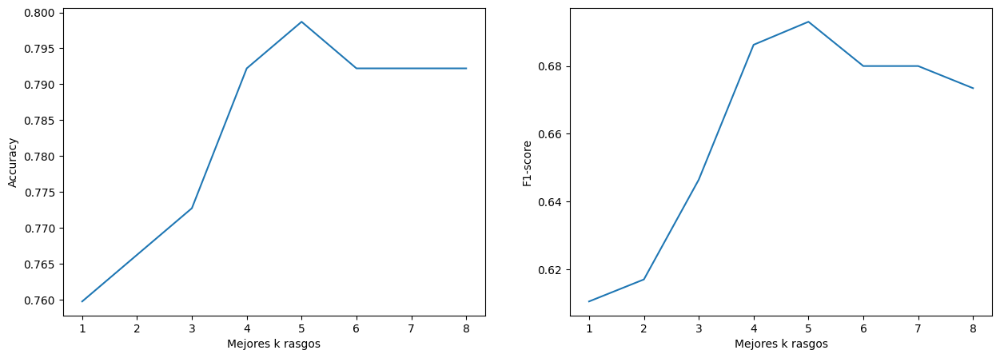

In [27]:
f1_list = []
accuracy_list=[]
for k in range(1, 9):
  bk = SelectKBest(fs.f_classif, k=k)
  bk.fit(train_x, train_y)
  X_train_trans = bk.transform(train_x)
  X_test_trans = bk.transform(test_x)
  lr = LogisticRegression(max_iter=1000)
  lr.fit(X_train_trans, train_y)
  y_pred = lr.predict(X_test_trans)
  accuracy=metrics.accuracy_score(test_y, y_pred)
  accuracy_list.append(accuracy)
  f1 = metrics.f1_score(test_y, y_pred)
  f1_list.append(f1)

fig, axe = plt.subplots(1,2,figsize=(15,5))
axe[0].plot(range(1, 9), accuracy_list)
axe[0].set_xlabel("Mejores k rasgos")
axe[0].set_ylabel("Accuracy")
axe[1].plot(range(1, 9), f1_list)
axe[1].set_xlabel("Mejores k rasgos")
axe[1].set_ylabel("F1-score")
plt.show()

In [28]:
np.argmax(accuracy_list)

np.int64(4)

En la posición 4, lo que significa que el mejor resultado lo obtiene con 5 rasgos

In [29]:
accuracy_list

[0.7597402597402597,
 0.7662337662337663,
 0.7727272727272727,
 0.7922077922077922,
 0.7987012987012987,
 0.7922077922077922,
 0.7922077922077922,
 0.7922077922077922]

In [30]:
accuracy_list[np.argmax(accuracy_list)]

0.7987012987012987

### Con validación cruzada y pipeline

In [31]:
from sklearn.model_selection import cross_val_score, StratifiedKFold
from sklearn.pipeline import Pipeline
from sklearn import metrics


In [32]:
# Listas para almacenar resultados
accuracy_list = []
f1_list = []

# Configuración de validación cruzada (estratificada para clasificación)
cv = StratifiedKFold(n_splits=10, shuffle=True, random_state=42)

for k in range(1, 9):
    # Pipeline: selección de k mejores rasgos + regresión logística
    pipe = Pipeline([
        ("select", SelectKBest(fs.f_classif, k=k)),
        ("lr", LogisticRegression(max_iter=1000))
    ])

    # Cross-validation para accuracy
    acc_scores = cross_val_score(pipe, train_x, train_y, cv=cv, scoring='accuracy')
    accuracy_list.append(np.mean(acc_scores))

    # Cross-validation para F1 (binario)
    f1_scores = cross_val_score(pipe, train_x, train_y, cv=cv, scoring='f1')
    f1_list.append(np.mean(f1_scores))




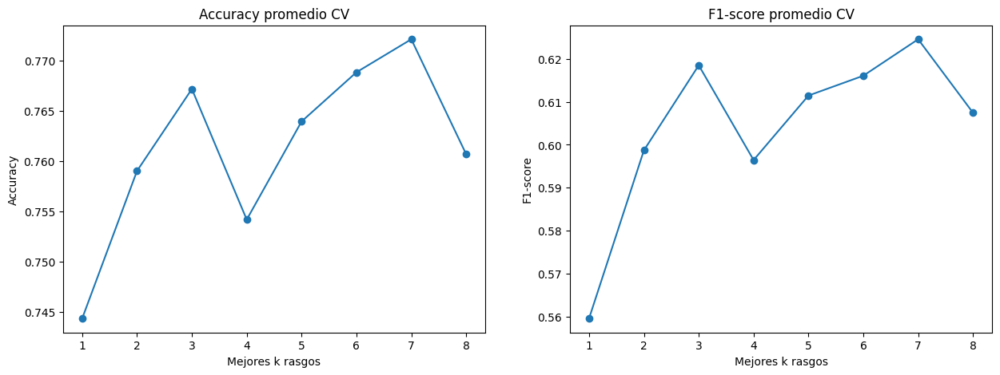

In [33]:
fig, axe = plt.subplots(1, 2, figsize=(15, 5))

axe[0].plot(range(1, 9), accuracy_list, marker="o")
axe[0].set_xlabel("Mejores k rasgos")
axe[0].set_ylabel("Accuracy")
axe[0].set_title("Accuracy promedio CV")

axe[1].plot(range(1, 9), f1_list, marker="o")
axe[1].set_xlabel("Mejores k rasgos")
axe[1].set_ylabel("F1-score")
axe[1].set_title("F1-score promedio CV")

plt.show()

In [34]:
best_k_acc = np.argmax(accuracy_list) + 1
best_k_f1 = np.argmax(f1_list) + 1
print(f"Mejor k según Accuracy: {best_k_acc}")
print(f"Mejor k según F1: {best_k_f1}")

Mejor k según Accuracy: 7
Mejor k según F1: 7


In [35]:
accuracy_list[np.argmax(accuracy_list)]

np.float64(0.7721311475409836)

In [36]:
selector = SelectKBest(fs.f_classif, k=best_k_f1)
selector.fit(train_x, train_y)

SelectKBest(k=np.int64(7))

Rasgos seleccionados

In [37]:
mask = selector.get_support()
mask

array([ True,  True, False,  True,  True,  True,  True,  True])

In [38]:
df.columns[0:-1]

Index(['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness', 'Insulin',
       'BMI', 'DiabetesPedigreeFunction', 'Age'],
      dtype='object')

In [39]:
features=df.columns[0:-1]
features

Index(['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness', 'Insulin',
       'BMI', 'DiabetesPedigreeFunction', 'Age'],
      dtype='object')

In [40]:
selected_features = features[mask]
selected_features

Index(['Pregnancies', 'Glucose', 'SkinThickness', 'Insulin', 'BMI',
       'DiabetesPedigreeFunction', 'Age'],
      dtype='object')

**Ejercicio**: Hacer con las otras formas de selección:
- chi-square (chi2)
- mutual_info_classif

### Las características también se puden probar por separado

In [41]:
MI=fs.mutual_info_classif(train_x, train_y)
MI

array([0.026, 0.1  , 0.026, 0.019, 0.024, 0.069, 0.011, 0.089])

In [42]:
mi_score_selected_index = np.where(MI >0.2)[0]
X_train = train_x[:,mi_score_selected_index]
X_test = test_x[:,mi_score_selected_index]

**Ejercicio**: Probar con estos rasgos

**Ejercicio**: Probar con breast cancer

In [43]:
from sklearn.datasets import load_breast_cancer
cancer = load_breast_cancer()
X = cancer['data']
y = cancer['target']

### Relief

In [44]:
array = df.values
X = array[:,0:-1]
Y = array[:,-1]

In [45]:
train_x, test_x, train_y, test_y = train_test_split(X,Y,test_size=0.2,random_state=7)

In [46]:
!pip install sklearn_relief

In [47]:
import sklearn_relief

In [48]:
r = sklearn_relief.ReliefF(n_features = 7)
X_train=r.fit_transform(train_x,train_y)
X_test=r.transform(test_x)
X_train

array([[3.30e+01, 2.63e-01, 3.61e+01, ..., 4.30e+01, 7.20e+01, 1.08e+02],
       [2.30e+01, 1.27e-01, 4.55e+01, ..., 3.60e+01, 8.60e+01, 1.02e+02],
       [3.10e+01, 8.03e-01, 3.29e+01, ..., 0.00e+00, 7.80e+01, 1.58e+02],
       ...,
       [6.70e+01, 7.35e-01, 2.17e+01, ..., 0.00e+00, 6.00e+01, 5.70e+01],
       [2.10e+01, 1.87e-01, 2.43e+01, ..., 0.00e+00, 5.80e+01, 1.05e+02],
       [3.60e+01, 7.19e-01, 3.27e+01, ..., 4.20e+01, 7.20e+01, 1.79e+02]])

In [49]:
lr = LogisticRegression(max_iter=1000)
lr.fit(X_train, train_y)
y_pred = lr.predict(X_test)
accuracy=metrics.accuracy_score(test_y, y_pred)
accuracy

0.7922077922077922

## Wrapper


### Forward Selection

In [50]:
from sklearn.svm import SVC

In [51]:
array = df.values
X = array[:,0:-1]
Y = array[:,-1]

In [52]:
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=.9, random_state=42)

In [53]:
sfs = fs.SequentialFeatureSelector(SVC(), n_features_to_select=2, cv=10)

In [54]:
sfs.fit(X_train, y_train)

SequentialFeatureSelector(cv=10, estimator=SVC(), n_features_to_select=2)

In [55]:
sfs.get_feature_names_out()

array(['x1', 'x5'], dtype=object)

### Recursive Feature Elimination

In [56]:
from sklearn.feature_selection import RFE
from sklearn.linear_model import LogisticRegression

In [57]:
from sklearn.preprocessing import StandardScaler

In [58]:
X_stand = StandardScaler().fit_transform(X_train)

In [59]:
model = LogisticRegression()
rfe = RFE(model, step = 1)
fit = rfe.fit(X_stand, y_train)
print("Número de rasgos: %s" % (fit.n_features_))
print("Rasgos seleccionados: %s" % (fit.support_))
print("Ranking de rasgos: %s" % (fit.ranking_))

Número de rasgos: 4
Rasgos seleccionados: [ True  True False False  True  True False False]
Ranking de rasgos: [1 1 2 5 1 1 3 4]


### Recursive Feature Elimination con Validación Cruzada

In [60]:
from sklearn.model_selection import StratifiedKFold
from sklearn.feature_selection import RFECV

In [61]:
svc = SVC(kernel="linear")
min_features_to_select = 1
rfecv = RFECV(
    estimator=svc,
    step=1,
    cv=StratifiedKFold(10),
    scoring="accuracy",
    min_features_to_select=min_features_to_select,
)
rfecv.fit(X_train, y_train)

RFECV(cv=StratifiedKFold(n_splits=10, random_state=None, shuffle=False),
      estimator=SVC(kernel='linear'), scoring='accuracy')

In [62]:
rfecv.cv_results_['mean_test_score']

array([0.579, 0.621, 0.725, 0.768, 0.796, 0.755, 0.712, 0.739])

In [63]:
print("Número óptimo de rasgos : %d" % rfecv.n_features_)

Número óptimo de rasgos : 5


In [64]:
rfecv.cv_results_

{'mean_test_score': array([0.579, 0.621, 0.725, 0.768, 0.796, 0.755, 0.712, 0.739]),
 'std_test_score': array([0.132, 0.142, 0.19 , 0.185, 0.188, 0.17 , 0.157, 0.146]),
 'split0_test_score': array([0.375, 0.5  , 0.875, 0.875, 0.875, 0.875, 0.875, 0.875]),
 'split1_test_score': array([0.625, 0.625, 0.75 , 0.875, 0.875, 0.875, 0.875, 0.875]),
 'split2_test_score': array([0.625, 0.625, 0.875, 0.875, 0.75 , 0.75 , 0.75 , 0.75 ]),
 'split3_test_score': array([0.625, 0.625, 0.625, 0.625, 0.625, 0.625, 0.625, 0.625]),
 'split4_test_score': array([0.625, 0.75 , 0.75 , 0.625, 0.75 , 0.625, 0.625, 0.75 ]),
 'split5_test_score': array([0.625, 0.375, 0.375, 0.375, 0.375, 0.375, 0.375, 0.375]),
 'split6_test_score': array([0.286, 0.429, 0.429, 0.714, 1.   , 0.714, 0.571, 0.857]),
 'split7_test_score': array([0.714, 0.714, 1.   , 1.   , 1.   , 0.857, 0.857, 0.857]),
 'split8_test_score': array([0.714, 0.714, 0.714, 0.714, 0.714, 0.857, 0.857, 0.714]),
 'split9_test_score': array([0.571, 0.857, 0.857

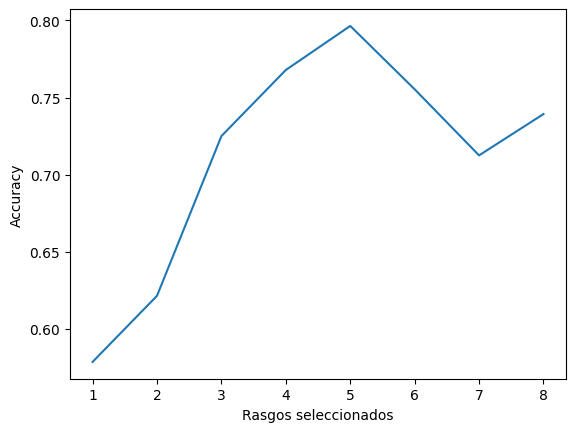

In [65]:
plt.figure()
plt.xlabel("Rasgos seleccionados")
plt.ylabel("Accuracy")
plt.plot(
    range(min_features_to_select, len(rfecv.cv_results_['mean_test_score']) + min_features_to_select),
    rfecv.cv_results_['mean_test_score']
)
plt.show()

Con pipeline

In [66]:
from sklearn.preprocessing import StandardScaler

In [67]:
df.columns

Index(['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness', 'Insulin',
       'BMI', 'DiabetesPedigreeFunction', 'Age', 'Outcome'],
      dtype='object')

In [68]:
target = "Outcome"
X = df.drop(columns=target)
y = df[target]

In [69]:
cv_inner = StratifiedKFold(n_splits=10, shuffle=True, random_state=42)

lr = LogisticRegression(
    max_iter=1000,
    class_weight="balanced"
)

rfecv = RFECV(
    estimator=lr,
    step=1,
    cv=cv_inner,
    scoring="f1",
    min_features_to_select=1,
    n_jobs=-1
)

pipe = Pipeline([
    ("scale", StandardScaler()),
    ("rfecv", rfecv)
])

pipe.fit(X, y)

Pipeline(steps=[('scale', StandardScaler()),
                ('rfecv',
                 RFECV(cv=StratifiedKFold(n_splits=10, random_state=42, shuffle=True),
                       estimator=LogisticRegression(class_weight='balanced',
                                                    max_iter=1000),
                       n_jobs=-1, scoring='f1'))])

In [70]:
rfecv_step = pipe.named_steps["rfecv"]
selected_mask = rfecv_step.support_
selected_features = X.columns[selected_mask]
k_optimo = rfecv_step.n_features_

In [71]:
print(f"Número óptimo de rasgos: {k_optimo}")
print("Rasgos seleccionados:", selected_features.tolist())

Número óptimo de rasgos: 6
Rasgos seleccionados: ['Pregnancies', 'Glucose', 'BloodPressure', 'BMI', 'DiabetesPedigreeFunction', 'Age']


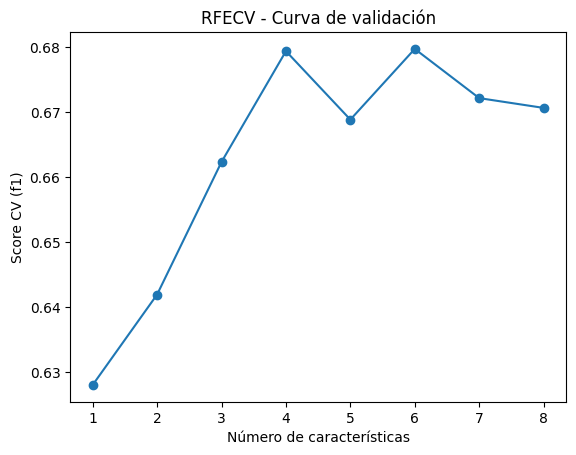

In [72]:
scores = getattr(rfecv_step, "cv_results_", None)
if scores is not None and "mean_test_score" in scores:
    mean_scores = scores["mean_test_score"]
else:
    # versiones antiguas de sklearn
    mean_scores = rfecv_step.grid_scores_


import matplotlib.pyplot as plt
plt.plot(range(1, len(mean_scores)+1), mean_scores, marker="o")
plt.xlabel("Número de características")
plt.ylabel("Score CV (f1)")
plt.title("RFECV - Curva de validación")
plt.show()


## Embedded

### Selección basada en L1

In [73]:
from sklearn.feature_selection import SelectFromModel
from sklearn.svm import LinearSVC

In [74]:
lsvc = LinearSVC(C=0.01, penalty="l1", dual=False, max_iter=2000).fit(X_train, y_train)
model = SelectFromModel(lsvc, prefit=True)
X_new = model.transform(X)
X_new.shape

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


(768, 4)

### Basada en árbol

In [75]:
from sklearn.ensemble import GradientBoostingClassifier

In [76]:
gb = GradientBoostingClassifier(n_estimators=20)
gb.fit(X_train, y_train)
print(gb.feature_importances_)

[0.056 0.282 0.015 0.031 0.098 0.157 0.245 0.115]


In [77]:
model = fs.SelectFromModel(gb, prefit=True)
X_trans = model.transform(X)
print(X_train.shape)
print(X_trans.shape)

(76, 8)
(768, 3)


/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2732: UserWarning: X has feature names, but SelectFromModel was fitted without feature names
  warnings.warn(


In [78]:
indexs=df.iloc[:,:-1].columns

<Axes: >

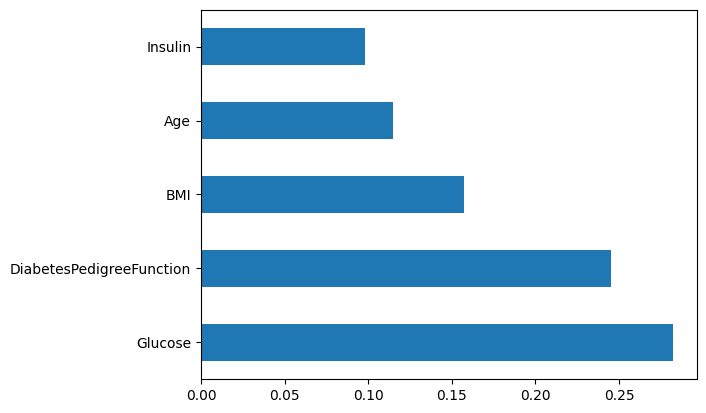

In [79]:
n=len(gb.feature_importances_)
(pd.Series(gb.feature_importances_, index=indexs)
   .nlargest(5)
   .plot(kind='barh'))

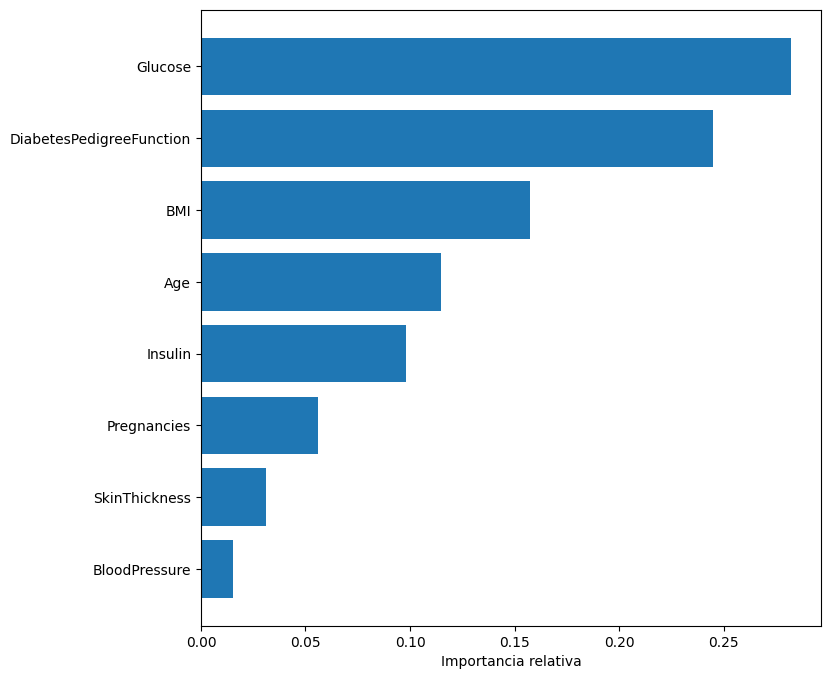

In [80]:
feature_importance = 100.0 * (gb.feature_importances_ / gb.feature_importances_.max())
sorted_idx = np.argsort(gb.feature_importances_)
pos = np.arange(sorted_idx.shape[0]) + .5
plt.figure(figsize=(8, 8))
plt.barh(pos, gb.feature_importances_[sorted_idx], align='center')
plt.yticks(pos, indexs[sorted_idx])
plt.xlabel('Importancia relativa')
plt.show()

## Comparación de los métodos de selección antes de SHAP

Antes de pasar a SHAP, conviene cerrar las técnicas anteriores con una comparación común. La idea no es mirar cada método por separado, sino responder:

**¿Qué método de selección produjo el mejor subconjunto de rasgos para esta base?**

Para que la comparación sea más justa, se usará el mismo esquema en todos los casos:

1. Se divide la base en entrenamiento y prueba.
2. Dentro del entrenamiento se separa una parte para validación.
3. Cada método selecciona sus rasgos usando solo entrenamiento/validación.
4. El conjunto de prueba se usa una sola vez para comparar los subconjuntos finales.
5. Todos los subconjuntos se evalúan con el mismo modelo predictivo.

En este ejemplo se usa como modelo de evaluación un `GradientBoostingClassifier`, porque después SHAP se calculará sobre un modelo basado en árboles.


In [81]:
from sklearn.model_selection import train_test_split, StratifiedKFold
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LogisticRegression
from sklearn.feature_selection import (
    SelectKBest, f_classif, chi2, mutual_info_classif,
    RFECV, SelectFromModel, SequentialFeatureSelector
)
from sklearn.ensemble import GradientBoostingClassifier
from sklearn import metrics
import warnings

warnings.filterwarnings("ignore")

target = "Outcome"
X_df = df.drop(columns=target)
y = df[target]
feature_names = X_df.columns

X_train, X_test, y_train, y_test = train_test_split(
    X_df, y, test_size=0.2, stratify=y, random_state=42
)

# Subconjunto interno para decidir hiperparámetros de selección, como el número k de rasgos.
X_subtrain, X_val, y_subtrain, y_val = train_test_split(
    X_train, y_train, test_size=0.25, stratify=y_train, random_state=42
)

def modelo_evaluacion():
    return GradientBoostingClassifier(n_estimators=20, random_state=42)

def calcular_metricas(y_real, y_pred):
    return {
        "Accuracy": metrics.accuracy_score(y_real, y_pred),
        "F1 binary": metrics.f1_score(y_real, y_pred, average="binary"),
        "F1 macro": metrics.f1_score(y_real, y_pred, average="macro")
    }

def evaluar_features_en_validacion(features):
    model = modelo_evaluacion()
    model.fit(X_subtrain[features], y_subtrain)
    pred_val = model.predict(X_val[features])
    return calcular_metricas(y_val, pred_val)

def evaluar_features_en_test(features):
    model = modelo_evaluacion()
    model.fit(X_train[features], y_train)
    pred_test = model.predict(X_test[features])
    return calcular_metricas(y_test, pred_test)

def seleccionar_mejor_k_desde_ranking(nombre, ranking_features):
    filas = []
    for k in range(1, len(ranking_features) + 1):
        feats = list(ranking_features[:k])
        met = evaluar_features_en_validacion(feats)
        filas.append({
            "Método": nombre,
            "k": k,
            "Rasgos": feats,
            "Accuracy validación": met["Accuracy"],
            "F1 binary validación": met["F1 binary"],
            "F1 macro validación": met["F1 macro"]
        })
    df_k = pd.DataFrame(filas)
    mejor = df_k.sort_values(
        by=["F1 binary validación", "Accuracy validación"],
        ascending=False
    ).iloc[0]
    return list(mejor["Rasgos"]), df_k

print("Entrenamiento:", X_train.shape)
print("Validación interna:", X_val.shape)
print("Prueba final:", X_test.shape)


Entrenamiento: (614, 8)
Validación interna: (154, 8)
Prueba final: (154, 8)


### Construcción de subconjuntos por método

A continuación se generan los subconjuntos de rasgos para varios métodos:

- Todos los rasgos, como línea base.
- `SelectKBest` con ANOVA F-test.
- `SelectKBest` con Chi-cuadrado.
- `SelectKBest` con información mutua.
- Forward Selection.
- RFECV.
- Selección embebida con regularización L1.
- Importancia de rasgos con Gradient Boosting.

Para los métodos que producen un ranking, se prueba desde top-1 hasta top-8 y se escoge el mejor número de rasgos usando validación.


1. Todos los rasgos

In [83]:
feature_sets_previos = {}
curvas_validacion_previas = {}

feature_sets_previos["Todos los rasgos"] = list(feature_names)

2. SelectKBest con ANOVA F-test

In [84]:
anova_selector = SelectKBest(score_func=f_classif, k="all")
anova_selector.fit(X_subtrain, y_subtrain)
anova_ranking = pd.Series(anova_selector.scores_, index=feature_names).sort_values(ascending=False).index
feature_sets_previos["SelectKBest ANOVA"] , curvas_validacion_previas["SelectKBest ANOVA"] = seleccionar_mejor_k_desde_ranking(
    "SelectKBest ANOVA", anova_ranking
)

3. SelectKBest con Chi-cuadrado

In [85]:
scaler_chi2 = MinMaxScaler()
X_subtrain_chi2 = scaler_chi2.fit_transform(X_subtrain)

chi2_selector = SelectKBest(score_func=chi2, k="all")
chi2_selector.fit(X_subtrain_chi2, y_subtrain)
chi2_ranking = pd.Series(chi2_selector.scores_, index=feature_names).sort_values(ascending=False).index
feature_sets_previos["SelectKBest Chi2"], curvas_validacion_previas["SelectKBest Chi2"] = seleccionar_mejor_k_desde_ranking(
    "SelectKBest Chi2", chi2_ranking
)

4. SelectKBest con información mutua

In [86]:
mi_scores = mutual_info_classif(X_subtrain, y_subtrain, random_state=42)
mi_ranking = pd.Series(mi_scores, index=feature_names).sort_values(ascending=False).index
feature_sets_previos["Información mutua"], curvas_validacion_previas["Información mutua"] = seleccionar_mejor_k_desde_ranking(
    "Información mutua", mi_ranking
)

5. Forward Selection

In [88]:
filas_sfs = []
for k in range(1, len(feature_names)):
    sfs = SequentialFeatureSelector(
        LogisticRegression(max_iter=2000, class_weight="balanced"),
        n_features_to_select=k,
        direction="forward",
        scoring="f1",
        cv=5,
        n_jobs=-1
    )

    pipe_sfs = Pipeline([
        ("scale", StandardScaler()),
        ("sfs", sfs)
    ])

    pipe_sfs.fit(X_subtrain, y_subtrain)
    selected = list(feature_names[pipe_sfs.named_steps["sfs"].get_support()])
    met = evaluar_features_en_validacion(selected)

    filas_sfs.append({
        "Método": "Forward Selection",
        "k": k,
        "Rasgos": selected,
        "Accuracy validación": met["Accuracy"],
        "F1 binary validación": met["F1 binary"],
        "F1 macro validación": met["F1 macro"]
    })

curvas_validacion_previas["Forward Selection"] = pd.DataFrame(filas_sfs)
mejor_sfs = curvas_validacion_previas["Forward Selection"].sort_values(
    by=["F1 binary validación", "Accuracy validación"],
    ascending=False
).iloc[0]
feature_sets_previos["Forward Selection"] = list(mejor_sfs["Rasgos"])

6. RFECV

In [89]:
rfecv = RFECV(
    estimator=LogisticRegression(max_iter=2000, class_weight="balanced"),
    step=1,
    cv=StratifiedKFold(n_splits=5, shuffle=True, random_state=42),
    scoring="f1",
    min_features_to_select=1,
    n_jobs=-1
)

pipe_rfecv = Pipeline([
    ("scale", StandardScaler()),
    ("rfecv", rfecv)
])

pipe_rfecv.fit(X_subtrain, y_subtrain)
feature_sets_previos["RFECV"] = list(feature_names[pipe_rfecv.named_steps["rfecv"].support_])


7. Selección embebida con L1

In [90]:
l1_model = LogisticRegression(
    penalty="l1",
    solver="liblinear",
    C=0.1,
    max_iter=2000,
    class_weight="balanced",
    random_state=42
)

pipe_l1 = Pipeline([
    ("scale", StandardScaler()),
    ("select", SelectFromModel(l1_model))
])

pipe_l1.fit(X_subtrain, y_subtrain)
mask_l1 = pipe_l1.named_steps["select"].get_support()

if mask_l1.sum() == 0:
    l1_model = LogisticRegression(
        penalty="l1",
        solver="liblinear",
        C=1.0,
        max_iter=2000,
        class_weight="balanced",
        random_state=42
    )
    pipe_l1 = Pipeline([
        ("scale", StandardScaler()),
        ("select", SelectFromModel(l1_model))
    ])
    pipe_l1.fit(X_subtrain, y_subtrain)
    mask_l1 = pipe_l1.named_steps["select"].get_support()

feature_sets_previos["L1 embebido"] = list(feature_names[mask_l1])


8. Importancia con Gradient Boosting

In [92]:
gb_selector = GradientBoostingClassifier(n_estimators=20, random_state=42)
gb_selector.fit(X_subtrain, y_subtrain)
gb_ranking = pd.Series(gb_selector.feature_importances_, index=feature_names).sort_values(ascending=False).index
feature_sets_previos["Importancia Gradient Boosting"], curvas_validacion_previas["Importancia Gradient Boosting"] = seleccionar_mejor_k_desde_ranking(
    "Importancia Gradient Boosting", gb_ranking
)
print(feature_sets_previos)

{'Todos los rasgos': ['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness', 'Insulin', 'BMI', 'DiabetesPedigreeFunction', 'Age'], 'SelectKBest ANOVA': ['Glucose', 'BMI', 'Age', 'DiabetesPedigreeFunction', 'Pregnancies', 'Insulin'], 'SelectKBest Chi2': ['Age', 'Glucose', 'Pregnancies', 'Insulin', 'DiabetesPedigreeFunction', 'BMI'], 'Información mutua': ['Glucose', 'Age', 'Insulin', 'BMI', 'Pregnancies', 'DiabetesPedigreeFunction'], 'Forward Selection': ['Glucose', 'BloodPressure', 'BMI', 'DiabetesPedigreeFunction', 'Age'], 'RFECV': ['Pregnancies', 'Glucose', 'BMI'], 'L1 embebido': ['Pregnancies', 'Glucose', 'BloodPressure', 'BMI', 'DiabetesPedigreeFunction', 'Age'], 'Importancia Gradient Boosting': ['Glucose', 'BMI', 'Age', 'DiabetesPedigreeFunction', 'Pregnancies', 'Insulin']}


### Evaluación final de los métodos previos

Una vez que cada técnica produjo su subconjunto de rasgos, se reentrena el mismo modelo con todo el conjunto de entrenamiento y se evalúa en el conjunto de prueba.

Esto permite comparar los métodos bajo las mismas métricas:

- `Accuracy`
- `F1 binary`
- `F1 macro`
- Número de rasgos seleccionados


In [93]:
resultados_previos = []

for metodo, feats in feature_sets_previos.items():
    met = evaluar_features_en_test(feats)
    resultados_previos.append({
        "Método": metodo,
        "Número de rasgos": len(feats),
        "Rasgos seleccionados": feats,
        "Accuracy prueba": met["Accuracy"],
        "F1 binary prueba": met["F1 binary"],
        "F1 macro prueba": met["F1 macro"]
    })

benchmark_prev_df = (
    pd.DataFrame(resultados_previos)
      .sort_values(by=["F1 binary prueba", "Accuracy prueba"], ascending=False)
      .reset_index(drop=True)
)

benchmark_prev_df


,Método,Número de rasgos,Rasgos seleccionados,Accuracy prueba,F1 binary prueba,F1 macro prueba
0,SelectKBest ANOVA,6,"[Glucose, BMI, Age, DiabetesPedigreeFunction, ...",0.753247,0.612245,0.715646
1,SelectKBest Chi2,6,"[Age, Glucose, Pregnancies, Insulin, DiabetesP...",0.753247,0.612245,0.715646
2,Información mutua,6,"[Glucose, Age, Insulin, BMI, Pregnancies, Diab...",0.753247,0.612245,0.715646
3,Importancia Gradient Boosting,6,"[Glucose, BMI, Age, DiabetesPedigreeFunction, ...",0.753247,0.612245,0.715646
4,Todos los rasgos,8,"[Pregnancies, Glucose, BloodPressure, SkinThic...",0.746753,0.606061,0.709729
5,L1 embebido,6,"[Pregnancies, Glucose, BloodPressure, BMI, Dia...",0.740260,0.591837,0.700680
6,Forward Selection,5,"[Glucose, BloodPressure, BMI, DiabetesPedigree...",0.733766,0.568421,0.687966
7,RFECV,3,"[Pregnancies, Glucose, BMI]",0.694805,0.543689,0.657211


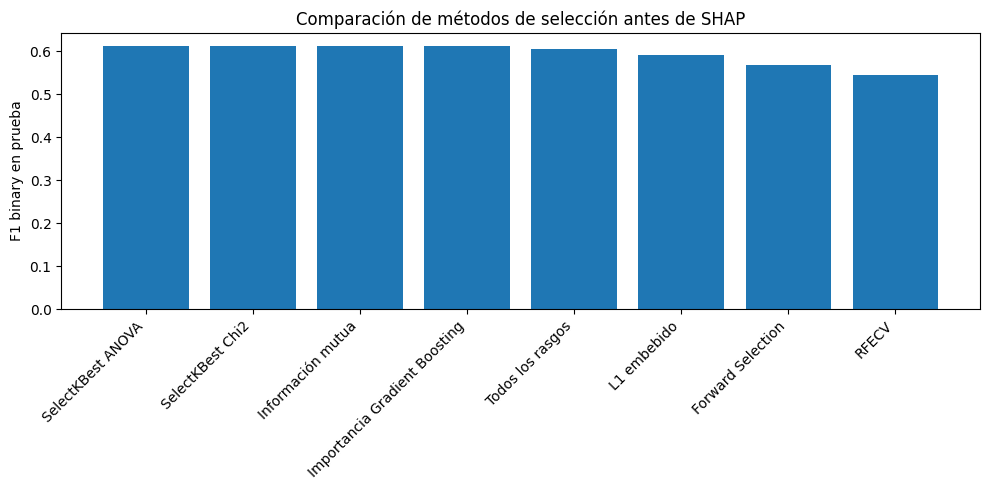

In [94]:
plt.figure(figsize=(10, 5))
plt.bar(benchmark_prev_df["Método"], benchmark_prev_df["F1 binary prueba"])
plt.xticks(rotation=45, ha="right")
plt.ylabel("F1 binary en prueba")
plt.title("Comparación de métodos de selección antes de SHAP")
plt.tight_layout()
plt.show()


### Estabilidad de los rasgos seleccionados

Además de comparar métricas, es útil revisar qué rasgos aparecen repetidamente en varios métodos. Si una variable es seleccionada por muchas estrategias diferentes, eso sugiere que su importancia es más estable.


In [95]:
from collections import Counter

contador_rasgos = Counter()

for metodo, feats in feature_sets_previos.items():
    if metodo != "Todos los rasgos":
        contador_rasgos.update(feats)

estabilidad_rasgos = (
    pd.DataFrame(contador_rasgos.items(), columns=["Rasgo", "Número de métodos que lo seleccionan"])
      .sort_values(by="Número de métodos que lo seleccionan", ascending=False)
      .reset_index(drop=True)
)

estabilidad_rasgos


,Rasgo,Número de métodos que lo seleccionan
0,Glucose,7
1,BMI,7
2,Age,6
3,DiabetesPedigreeFunction,6
4,Pregnancies,6
5,Insulin,4
6,BloodPressure,2


### Conclusión de la comparación

Esta tabla permite discutir dos cosas distintas:

1. **Desempeño predictivo:** qué método obtiene mejor `F1 binary`, `F1 macro` o `Accuracy`.
2. **Reducción de variables:** qué método logra un desempeño competitivo usando menos rasgos.

Por eso, el mejor método no siempre es simplemente el de mayor métrica. En selección de rasgos también importa el compromiso entre desempeño, simplicidad e interpretabilidad.

Después de esta comparación, SHAP se introduce como una técnica adicional que no solo selecciona rasgos, sino que también explica por qué esos rasgos son importantes para el modelo.


## Importancia de rasgos con SHAP (Shapley Additive Explanations)

Hasta ahora se han revisado técnicas de selección de rasgos que producen directamente un subconjunto de variables. SHAP puede usarse de una forma un poco diferente: primero interpreta un modelo ya entrenado y estima cuánto aporta cada variable a las predicciones; luego esa importancia puede convertirse en un criterio de selección.

La idea central es:

1. Entrenar un modelo base.
2. Calcular los valores SHAP para las variables de entrada.
3. Ordenar los rasgos según su importancia global, usando el promedio de los valores absolutos de SHAP.
4. Evaluar subconjuntos progresivos de rasgos: top 1, top 2, top 3, etc.
5. Comparar el desempeño contra el modelo entrenado con todos los rasgos.

Aunque SHAP se calcula localmente para cada instancia, podemos obtener una medida global promediando la magnitud de sus contribuciones en todas las instancias.

Ver: https://christophm.github.io/interpretable-ml-book/shapley.html#shapley


In [96]:
!pip install shap -q

In [97]:
import shap

### Preparación de datos y modelo de referencia

Primero se vuelve a definir la separación entre variables predictoras y variable objetivo. Luego se entrena un modelo con **todos los rasgos**, que servirá como referencia para comparar si la selección basada en SHAP realmente ayuda o si simplemente elimina información útil.


In [98]:
target = "Outcome"
X_df = df.drop(columns=target)
y = df[target]
feature_names = X_df.columns

X_train, X_test, y_train, y_test = train_test_split(
    X_df, y, test_size=0.2, stratify=y, random_state=42
)

# Separamos una parte del entrenamiento para decidir cuántos rasgos seleccionar.
# El conjunto de prueba queda reservado para la evaluación final.
X_subtrain, X_val, y_subtrain, y_val = train_test_split(
    X_train, y_train, test_size=0.25, stratify=y_train, random_state=42
)

print("Entrenamiento para selección:", X_subtrain.shape)
print("Validación para seleccionar k:", X_val.shape)
print("Prueba final:", X_test.shape)

Entrenamiento para selección: (460, 8)
Validación para seleccionar k: (154, 8)
Prueba final: (154, 8)


In [115]:
gb_all = GradientBoostingClassifier(n_estimators=20, random_state=42)
gb_all.fit(X_train, y_train)

pred_all = gb_all.predict(X_test)

baseline_acc = metrics.accuracy_score(y_test, pred_all)
baseline_f1 = metrics.f1_score(y_test, pred_all, average="binary")
baseline_f1_macro = metrics.f1_score(y_test, pred_all, average="macro")

print("Modelo con todos los rasgos")
print("Accuracy:", baseline_acc)
print("F1 binary:", baseline_f1)
print("F1 macro:", baseline_f1_macro)

Modelo con todos los rasgos
Accuracy: 0.7467532467532467
F1 binary: 0.6060606060606061
F1 macro: 0.7097288676236044


### Cálculo de SHAP e interpretación global

Se entrena un modelo sobre el subconjunto de entrenamiento usado para selección. Después se calculan los valores SHAP y se visualizan las contribuciones de cada rasgo.

Los gráficos de SHAP ayudan a responder dos preguntas:

- ¿Qué variables tienen mayor impacto promedio sobre las predicciones?
- ¿La presencia de valores altos o bajos de una variable empuja la predicción hacia una clase u otra?


In [116]:
gb_shap = GradientBoostingClassifier(n_estimators=20, random_state=42)
gb_shap.fit(X_subtrain, y_subtrain)

explainer = shap.TreeExplainer(gb_shap)
shap_values = explainer(X_subtrain)

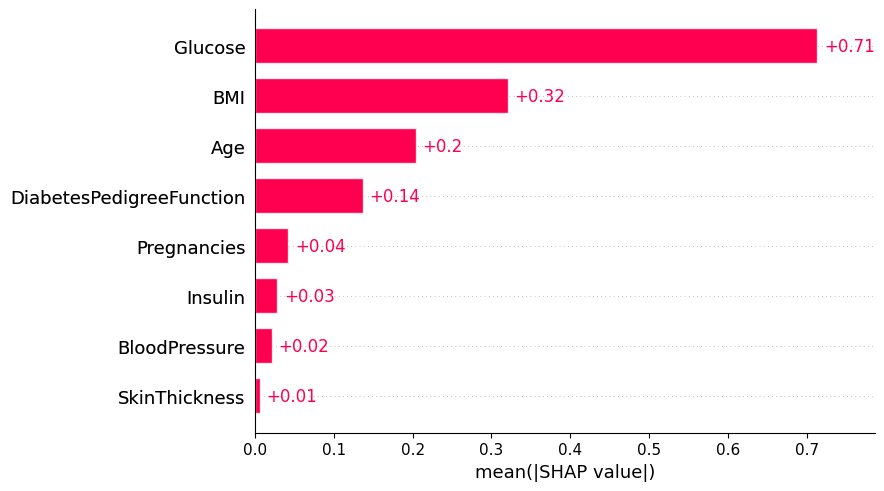

In [117]:
shap.plots.bar(shap_values)

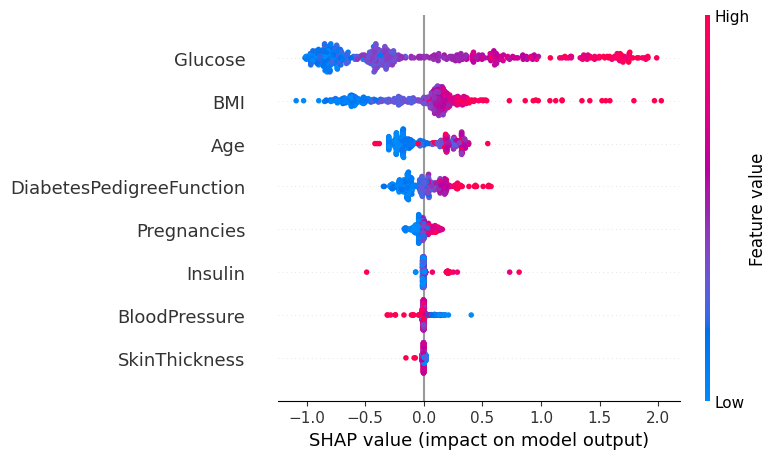

In [118]:
shap.summary_plot(shap_values, features=X_subtrain)

### Ranking de rasgos a partir de SHAP

Para transformar SHAP en una técnica de selección, se calcula la importancia global de cada variable como:

$$
I_j = \frac{1}{n}\sum_{i=1}^{n} |SHAP_{ij}|
$$

Es decir, para cada rasgo se promedia el valor absoluto de sus contribuciones sobre todas las observaciones. Las variables con mayor valor medio absoluto son las que más influyen en el modelo.


In [119]:
values = shap_values.values
shap_importance = np.abs(values).mean(axis=0)

feature_importance_shap = (
    pd.Series(shap_importance, index=feature_names)
      .sort_values(ascending=False)
)

feature_importance_shap

,0
Glucose,0.713513
BMI,0.320461
Age,0.203988
DiabetesPedigreeFunction,0.136653
Pregnancies,0.042317
Insulin,0.028507
BloodPressure,0.021019
SkinThickness,0.005901


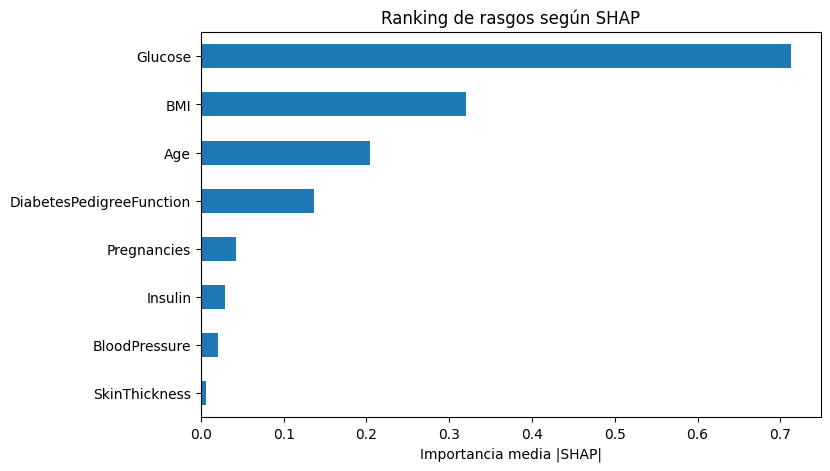

In [114]:
plt.figure(figsize=(8, 5))
feature_importance_shap.sort_values().plot(kind="barh")
plt.xlabel("Importancia media |SHAP|")
plt.title("Ranking de rasgos según SHAP")
plt.show()

### Selección por top-k rasgos SHAP

Ahora se evalúa el desempeño del modelo usando los primeros **k** rasgos del ranking SHAP. El valor de **k** se decide usando el conjunto de validación, no el conjunto de prueba. Esto evita escoger el número de rasgos mirando directamente el desempeño final.


In [104]:
ks = range(1, X_train.shape[1] + 1)
results = []

for k in ks:
    topk = feature_importance_shap.index[:k]

    gb_k = GradientBoostingClassifier(n_estimators=20, random_state=42)
    gb_k.fit(X_subtrain[topk], y_subtrain)

    pred_val = gb_k.predict(X_val[topk])

    results.append({
        "k": k,
        "rasgos": list(topk),
        "accuracy_val": metrics.accuracy_score(y_val, pred_val),
        "f1_binary_val": metrics.f1_score(y_val, pred_val, average="binary"),
        "f1_macro_val": metrics.f1_score(y_val, pred_val, average="macro")
    })

results_df = pd.DataFrame(results)
results_df

,k,rasgos,accuracy_val,f1_binary_val,f1_macro_val
0,1,[Glucose],0.733766,0.517647,0.666895
1,2,"[Glucose, BMI]",0.772727,0.631579,0.733630
2,3,"[Glucose, BMI, Age]",0.785714,0.659794,0.751698
3,4,"[Glucose, BMI, Age, DiabetesPedigreeFunction]",0.785714,0.652632,0.748851
4,5,"[Glucose, BMI, Age, DiabetesPedigreeFunction, ...",0.792208,0.659574,0.755021
5,6,"[Glucose, BMI, Age, DiabetesPedigreeFunction, ...",0.798701,0.673684,0.764072
6,7,"[Glucose, BMI, Age, DiabetesPedigreeFunction, ...",0.785714,0.645161,0.745836
7,8,"[Glucose, BMI, Age, DiabetesPedigreeFunction, ...",0.792208,0.659574,0.755021


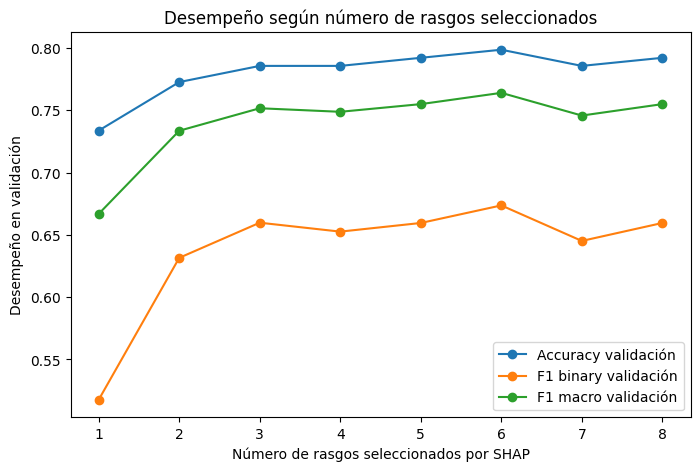

In [105]:
plt.figure(figsize=(8, 5))
plt.plot(results_df["k"], results_df["accuracy_val"], marker="o", label="Accuracy validación")
plt.plot(results_df["k"], results_df["f1_binary_val"], marker="o", label="F1 binary validación")
plt.plot(results_df["k"], results_df["f1_macro_val"], marker="o", label="F1 macro validación")

plt.xlabel("Número de rasgos seleccionados por SHAP")
plt.ylabel("Desempeño en validación")
plt.title("Desempeño según número de rasgos seleccionados")
plt.legend()
plt.show()

In [106]:
best_row = results_df.sort_values(
    by=["f1_binary_val", "accuracy_val"], ascending=False
).iloc[0]

best_k = int(best_row["k"])
best_features = feature_importance_shap.index[:best_k]

print("Mejor k según validación:", best_k)
print("Rasgos seleccionados:", list(best_features))
print("F1 binary validación:", best_row["f1_binary_val"])
print("Accuracy validación:", best_row["accuracy_val"])

Mejor k según validación: 6
Rasgos seleccionados: ['Glucose', 'BMI', 'Age', 'DiabetesPedigreeFunction', 'Pregnancies', 'Insulin']
F1 binary validación: 0.6736842105263158
Accuracy validación: 0.7987012987012987


### Evaluación final del subconjunto seleccionado

Una vez definido el número de rasgos, se vuelve a entrenar el modelo con todo el conjunto de entrenamiento, pero usando solamente los rasgos seleccionados por SHAP. Luego se evalúa una única vez sobre el conjunto de prueba.


In [120]:
gb_final_shap = GradientBoostingClassifier(n_estimators=20, random_state=42)
gb_final_shap.fit(X_train[best_features], y_train)

pred_shap = gb_final_shap.predict(X_test[best_features])

shap_acc = metrics.accuracy_score(y_test, pred_shap)
shap_f1 = metrics.f1_score(y_test, pred_shap, average="binary")
shap_f1_macro = metrics.f1_score(y_test, pred_shap, average="macro")

comparison_df = pd.DataFrame({
    "Método": ["Todos los rasgos", "SHAP top-k"],
    "Número de rasgos": [X_train.shape[1], len(best_features)],
    "Rasgos seleccionados": [list(feature_names), list(best_features)],
    "Accuracy prueba": [baseline_acc, shap_acc],
    "F1 binary prueba": [baseline_f1, shap_f1],
    "F1 macro prueba": [baseline_f1_macro, shap_f1_macro]
})

comparison_df


,Método,Número de rasgos,Rasgos seleccionados,Accuracy prueba,F1 binary prueba,F1 macro prueba
0,Todos los rasgos,8,"[Pregnancies, Glucose, BloodPressure, SkinThic...",0.746753,0.606061,0.709729
1,SHAP top-k,6,"[Glucose, BMI, Age, DiabetesPedigreeFunction, ...",0.753247,0.612245,0.715646


### Selección por importancia acumulada

Otra forma de usar SHAP es seleccionar los rasgos que acumulan cierto porcentaje de la importancia total. Por ejemplo, se pueden conservar los rasgos que explican aproximadamente el 95 % de la importancia global del modelo.


In [121]:
cum_importance = (feature_importance_shap / feature_importance_shap.sum()).cumsum()
selected_by_cum = cum_importance[cum_importance <= 0.95].index

# Si el primer rasgo supera el umbral, se conserva al menos un rasgo.
if len(selected_by_cum) == 0:
    selected_by_cum = feature_importance_shap.index[:1]

print("Rasgos seleccionados por importancia acumulada:")
print(list(selected_by_cum))
print("Importancia acumulada:", cum_importance.loc[selected_by_cum[-1]])

Rasgos seleccionados por importancia acumulada:
['Glucose', 'BMI', 'Age', 'DiabetesPedigreeFunction']
Importancia acumulada: 0.9336134328832313


In [122]:
gb_cum = GradientBoostingClassifier(n_estimators=20, random_state=42)
gb_cum.fit(X_train[selected_by_cum], y_train)

pred_cum = gb_cum.predict(X_test[selected_by_cum])

comparison_cum_df = pd.DataFrame({
    "Método": ["Todos los rasgos", "SHAP top-k", "SHAP 95% acumulado"],
    "Número de rasgos": [X_train.shape[1], len(best_features), len(selected_by_cum)],
    "Rasgos seleccionados": [list(feature_names), list(best_features), list(selected_by_cum)],
    "Accuracy prueba": [
        baseline_acc,
        shap_acc,
        metrics.accuracy_score(y_test, pred_cum)
    ],
    "F1 binary prueba": [
        baseline_f1,
        shap_f1,
        metrics.f1_score(y_test, pred_cum, average="binary")
    ],
    "F1 macro prueba": [
        baseline_f1_macro,
        shap_f1_macro,
        metrics.f1_score(y_test, pred_cum, average="macro")
    ]
})

comparison_cum_df


,Método,Número de rasgos,Rasgos seleccionados,Accuracy prueba,F1 binary prueba,F1 macro prueba
0,Todos los rasgos,8,"[Pregnancies, Glucose, BloodPressure, SkinThic...",0.746753,0.606061,0.709729
1,SHAP top-k,6,"[Glucose, BMI, Age, DiabetesPedigreeFunction, ...",0.753247,0.612245,0.715646
2,SHAP 95% acumulado,4,"[Glucose, BMI, Age, DiabetesPedigreeFunction]",0.727273,0.553191,0.678465


### Comparación global incluyendo SHAP

Finalmente, se integran los resultados de SHAP con la tabla comparativa de los métodos anteriores.


In [123]:
if "benchmark_prev_df" in globals():
    shap_rows = comparison_cum_df[comparison_cum_df["Método"] != "Todos los rasgos"]

    benchmark_global_df = (
        pd.concat([benchmark_prev_df, shap_rows], ignore_index=True)
          .drop_duplicates(subset=["Método"], keep="last")
          .sort_values(by=["F1 binary prueba", "Accuracy prueba"], ascending=False)
          .reset_index(drop=True)
    )
else:
    benchmark_global_df = comparison_cum_df.sort_values(
        by=["F1 binary prueba", "Accuracy prueba"],
        ascending=False
    ).reset_index(drop=True)

benchmark_global_df


,Método,Número de rasgos,Rasgos seleccionados,Accuracy prueba,F1 binary prueba,F1 macro prueba
0,SelectKBest ANOVA,6,"[Glucose, BMI, Age, DiabetesPedigreeFunction, ...",0.753247,0.612245,0.715646
1,SelectKBest Chi2,6,"[Age, Glucose, Pregnancies, Insulin, DiabetesP...",0.753247,0.612245,0.715646
2,Información mutua,6,"[Glucose, Age, Insulin, BMI, Pregnancies, Diab...",0.753247,0.612245,0.715646
3,Importancia Gradient Boosting,6,"[Glucose, BMI, Age, DiabetesPedigreeFunction, ...",0.753247,0.612245,0.715646
4,SHAP top-k,6,"[Glucose, BMI, Age, DiabetesPedigreeFunction, ...",0.753247,0.612245,0.715646
5,Todos los rasgos,8,"[Pregnancies, Glucose, BloodPressure, SkinThic...",0.746753,0.606061,0.709729
6,L1 embebido,6,"[Pregnancies, Glucose, BloodPressure, BMI, Dia...",0.740260,0.591837,0.700680
7,Forward Selection,5,"[Glucose, BloodPressure, BMI, DiabetesPedigree...",0.733766,0.568421,0.687966
8,SHAP 95% acumulado,4,"[Glucose, BMI, Age, DiabetesPedigreeFunction]",0.727273,0.553191,0.678465
9,RFECV,3,"[Pregnancies, Glucose, BMI]",0.694805,0.543689,0.657211


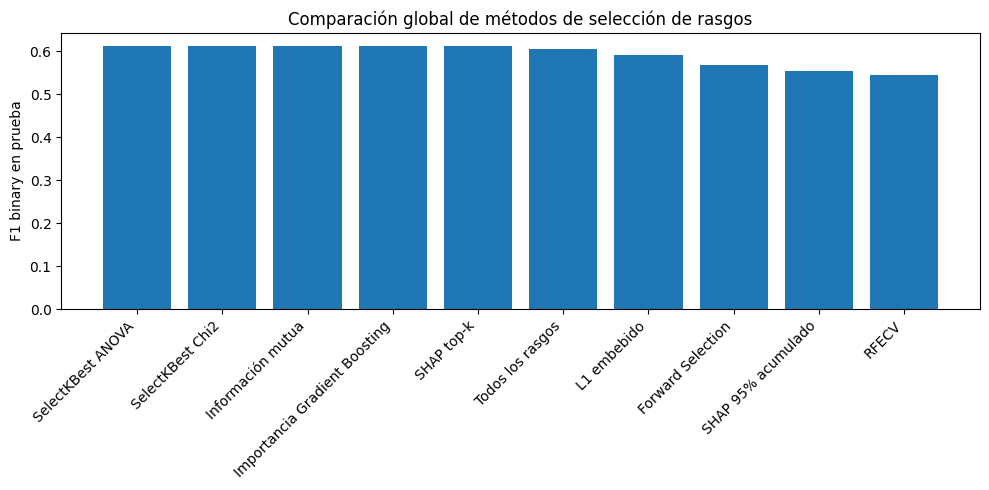

In [124]:
plt.figure(figsize=(10, 5))
plt.bar(benchmark_global_df["Método"], benchmark_global_df["F1 binary prueba"])
plt.xticks(rotation=45, ha="right")
plt.ylabel("F1 binary en prueba")
plt.title("Comparación global de métodos de selección de rasgos")
plt.tight_layout()
plt.show()


## Conclusión de SHAP

SHAP permite cerrar el proceso de selección de rasgos conectando dos objetivos: **interpretabilidad** y **reducción de variables**. Primero se usa para explicar cuáles variables influyen más en las predicciones del modelo; después, ese mismo ranking se utiliza para construir subconjuntos de rasgos y evaluar si es posible mantener un desempeño similar usando menos información.

En este flujo, la decisión no se toma únicamente a partir del gráfico de importancia. El ranking SHAP se complementa con una comparación cuantitativa entre:

- el modelo entrenado con todos los rasgos;
- el modelo entrenado con los mejores rasgos según SHAP;
- el modelo entrenado con los rasgos que acumulan la mayor parte de la importancia global.

De esta forma, SHAP no queda solo como una herramienta de explicación, sino como una estrategia práctica para seleccionar variables. Sin embargo, la selección final debe apoyarse en validación y comparación de métricas, dejando el conjunto de prueba exclusivamente para la evaluación final.
